# Covid-19 Clustering Analysis

This data is provided by the WHO to identify whether any person is having a coronavirus disease or not based on some pre-defined standard symptoms.  
The dataset contains seven major variables that will be having an impact on whether someone has coronavirus disease or not, the description of each variable are as follows,
* Country: List of countries person visited.
* Age: Classification of the age group for each person, based on WHO Age Group Standard
* Symptoms: According to WHO, 5 are major symptoms of COVID-19, Fever, Tiredness, Difficulty in breathing, Dry cough, and sore throat.
* Experience any other symptoms: Pains, Nasal Congestion, Runny Nose, Diarrhea and Other.
* Severity: The level of severity, Mild, Moderate, Severe
* Contact: Has the person contacted some other COVID-19 Patient

# Main Objective

Given the large population of samples (316,800) labels /rows of data, and 26 different categorical variables, we have decided to apply unsupervised learning technique to determine if there are certain unique clusters or aggregation that we group together to better predict if someone is having coronovirus or not. 

In [60]:
# Load packages

from sklearn.preprocessing import StandardScaler

import pandas as pd
import numpy as np
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler , Normalizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.stats import norm
from scipy import stats
from sklearn import metrics
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

### Data Loading

In [61]:
df = pd.read_csv("Cleaned-Data.csv")
pd.pandas.set_option('display.max_columns', None)

### EDA

In [62]:
display('Peeking into data', df)

'Peeking into data'

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,None_Experiencing,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes,Country
0,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,China
1,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,China
2,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,China
3,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,China
4,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,China
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316795,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,Other
316796,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,Other
316797,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,Other
316798,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,Other


In [63]:
# Null Values
display("Null Values", df.isnull().sum())

'Null Values'

Fever                      0
Tiredness                  0
Dry-Cough                  0
Difficulty-in-Breathing    0
Sore-Throat                0
None_Sympton               0
Pains                      0
Nasal-Congestion           0
Runny-Nose                 0
Diarrhea                   0
None_Experiencing          0
Age_0-9                    0
Age_10-19                  0
Age_20-24                  0
Age_25-59                  0
Age_60+                    0
Gender_Female              0
Gender_Male                0
Gender_Transgender         0
Severity_Mild              0
Severity_Moderate          0
Severity_None              0
Severity_Severe            0
Contact_Dont-Know          0
Contact_No                 0
Contact_Yes                0
Country                    0
dtype: int64

<AxesSubplot:>

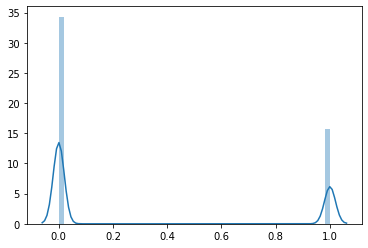

In [64]:
# Check distribution of data
sns.distplot(df.drop('Country', axis = 1))

In [65]:
for i in df.columns:
    print ("\nColumn Name:", i, "-->", df[i].unique(), "-->Unique Count", len(df[i].unique()))


Column Name: Fever --> [1 0] -->Unique Count 2

Column Name: Tiredness --> [1 0] -->Unique Count 2

Column Name: Dry-Cough --> [1 0] -->Unique Count 2

Column Name: Difficulty-in-Breathing --> [1 0] -->Unique Count 2

Column Name: Sore-Throat --> [1 0] -->Unique Count 2

Column Name: None_Sympton --> [0 1] -->Unique Count 2

Column Name: Pains --> [1 0] -->Unique Count 2

Column Name: Nasal-Congestion --> [1 0] -->Unique Count 2

Column Name: Runny-Nose --> [1 0] -->Unique Count 2

Column Name: Diarrhea --> [1 0] -->Unique Count 2

Column Name: None_Experiencing --> [0 1] -->Unique Count 2

Column Name: Age_0-9 --> [1 0] -->Unique Count 2

Column Name: Age_10-19 --> [0 1] -->Unique Count 2

Column Name: Age_20-24 --> [0 1] -->Unique Count 2

Column Name: Age_25-59 --> [0 1] -->Unique Count 2

Column Name: Age_60+ --> [0 1] -->Unique Count 2

Column Name: Gender_Female --> [0 1] -->Unique Count 2

Column Name: Gender_Male --> [1 0] -->Unique Count 2

Column Name: Gender_Transgender -->

In [66]:
def removing(list1):
    list1 = set(list1)
    list1.discard("No")

    a = ''.join(list1)
    return a

In [67]:
# ## Combine all the severity into 1 columns
# severity_columns = df.filter(like='Severity_').columns

# # Replace '0' with No
# df['Severity_None'].replace({1:'None', 0: "No"}, inplace = True)
# df['Severity_Mild'].replace({1:'Mild', 0: "No"}, inplace = True)
# df['Severity_Moderate'].replace({1:'Moderate', 0: "No"}, inplace = True)
# df['Severity_Severe'].replace({1:'Severe', 0: "No"}, inplace = True)

# # Create new column called Condition
# df['Condition'] = df[severity_columns].values.tolist()
# df['Condition'] = df['Condition'].apply(removing)

# df.drop(columns= severity_columns, inplace=True)

In [68]:
## Grouping by severity
severity_columns = df.filter(like='Severity_').columns
age_columns = df.filter(like='Age_').columns
gender_columns = df.filter(like='Gender_').columns
contact_columns = df.filter(like='Contact_').columns


In [69]:
No_risk_age = df.groupby(['Severity_None'])[age_columns].sum()
No_risk_gender = df.groupby(['Severity_None'])[gender_columns].sum()
No_risk_contact = df.groupby(['Severity_None'])[contact_columns].sum()


In [70]:
Low_risk_age = df.groupby(['Severity_Mild'])[age_columns].sum()
Low_risk_gender = df.groupby(['Severity_Mild'])[gender_columns].sum()
Low_risk_contact = df.groupby(['Severity_Mild'])[contact_columns].sum()


In [71]:
Moderate_risk_age = df.groupby(['Severity_Moderate'])[age_columns].sum()
Moderate_risk_gender = df.groupby(['Severity_Moderate'])[gender_columns].sum()
Moderate_risk_contact = df.groupby(['Severity_Moderate'])[contact_columns].sum()


In [72]:
Severe_risk_age = df.groupby(['Severity_Severe'])[age_columns].sum()
Severe_risk_gender = df.groupby(['Severity_Severe'])[gender_columns].sum()
Severe_risk_contact = df.groupby(['Severity_Severe'])[contact_columns].sum()


### Preprocessing

In this section, we will convert the conditions by applying one-hot encoding, converting them into columns of 1-s and 0-s.

In [73]:
## Remove country, remove severity_columns : Severity_Mild, Severity_Moderate, Severity_Severe.

# df.drop("Country", axis=1, inplace=True) 
df.drop(severity_columns, axis=1, inplace=True)
df['Symptoms_Score']= df.iloc[:, :5].sum(axis=1) + df.iloc[:, 6:10].sum(axis=1)
df.shape

(316800, 24)

### Feature Engineering

## Unsupervised learning

In [74]:
# Reload data
corona_pd = pd.read_csv("Cleaned-Data.csv")
corona_pd.sample(5)

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,None_Experiencing,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes,Country
240371,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,UAE
81966,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,Iran
56961,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,Italy
312990,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,Other
96743,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,Republic of Korean


In [75]:
## Remove Country from corona_df
corona_pd.drop("Country", axis = 1, inplace=True)

## Check for duplicated values
corona_pd.drop_duplicates(inplace=True)

<AxesSubplot:>

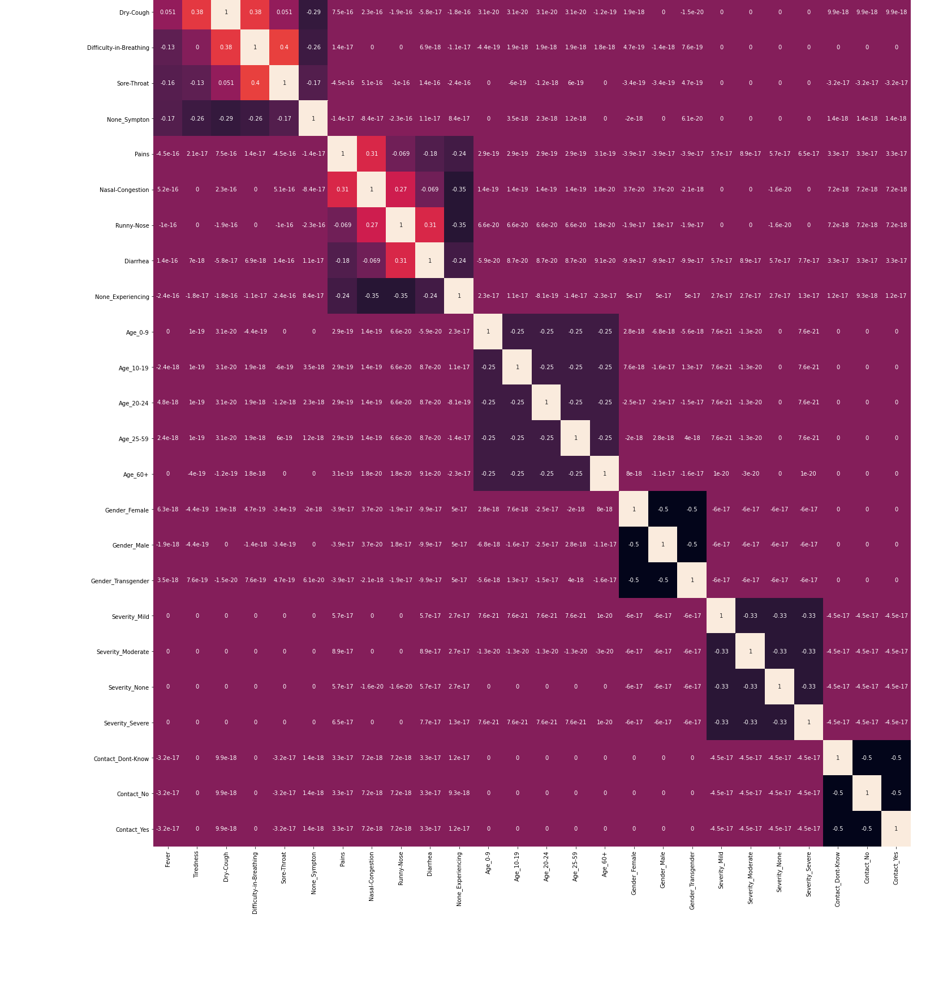

In [76]:
## Plot correlation matrix between features
f, ax = plt.subplots(figsize =(30,30))
sns.heatmap(corona_pd.corr(), annot=True)

We can see that each feature has an effect on other features linear correlated.


### Elbow Method to find optimal number of clusters

In [77]:
# Scale values
scaler = StandardScaler()
corona_pd_scaled = scaler.fit_transform(corona_pd)

In [78]:
# To get Within Cluster Sum of Squares for each cluster to find optimal number of K values
scores = []
for i in range(1,20):
    corona_means = KMeans(n_clusters=i)
    corona_means.fit(corona_pd_scaled)
    scores.append(corona_means.inertia_)

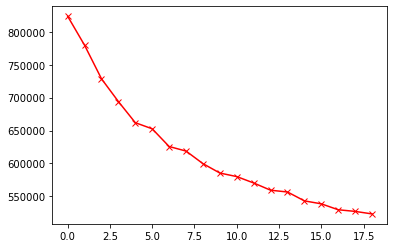

In [79]:
# Plot values from Kmeans
plt.plot(scores, '-rx')

From our graph, it looks like an elbow at n_cluster = 4. We will try to do K-means clustering with 4 cluster centroid.

In [80]:
## K-Means implementation
corona_means= KMeans(n_clusters=4, random_state = 111)
corona_means.fit(corona_pd_scaled)

# Return an array with cluster labels.list
labels = corona_means.labels_

In [81]:
# Create Data frame with Cluster Centres
corona_pd_m = pd.DataFrame(corona_means.cluster_centers_, columns=corona_pd.columns)
corona_pd_m.head()

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,None_Experiencing,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes
0,0.044947,0.066667,0.075593,0.066667,0.044947,-0.258199,-2.354598e-17,1.517417e-16,1.845774e-16,-3.541359e-17,-1.134222e-16,-8.037412e-17,5.748768e-18,-3.444355e-17,5.455372e-17,4.589202e-17,4.700892e-15,-1.046453e-14,-1.092334e-14,-2.901719e-19,-2.761540e-19,-1.848970e-17,-3.210115e-19,1.414214e+00,-7.071068e-01,-7.071068e-01
1,0.044947,0.066667,0.075593,0.066667,0.044947,-0.258199,-2.345626e-17,1.521006e-16,1.832541e-16,-3.846390e-17,-1.175491e-16,-8.037412e-17,5.748768e-18,-3.444355e-17,5.455372e-17,4.589202e-17,4.700892e-15,-1.049898e-14,-1.093482e-14,-2.901719e-19,-2.873683e-19,-1.848970e-17,-2.985827e-19,-7.071068e-01,-7.071068e-01,1.414214e+00
2,-0.674200,-1.000000,-1.133893,-1.000000,-0.674200,3.872983,4.116166e-16,-2.409408e-16,3.970449e-16,5.021937e-17,5.318978e-16,-8.611588e-17,-7.170190e-18,1.436141e-17,5.742460e-17,4.302114e-17,4.462480e-16,1.376284e-16,1.410348e-16,-3.609627e-18,-1.128446e-18,-7.086083e-17,-1.240590e-18,7.401487e-17,7.401487e-17,7.401487e-17
3,0.044947,0.066667,0.075593,0.066667,0.044947,-0.258199,-2.345626e-17,1.585600e-16,1.834335e-16,-3.868819e-17,-1.137810e-16,-8.037412e-17,5.748768e-18,-3.444355e-17,5.455372e-17,4.589202e-17,4.712375e-15,-1.048750e-14,-1.092334e-14,-2.901719e-19,-2.985827e-19,-1.848970e-17,-3.434402e-19,-7.071068e-01,1.414214e+00,-7.071068e-01


In [82]:
# Concatenating cluster lables
corona_cluster = pd.concat([corona_pd, pd.DataFrame({"Cluster":labels})], axis=1)
corona_cluster.sample(5)

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,None_Experiencing,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes,Cluster
27203,0,0,0,0,1,0,1,1,1,1,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0
26231,0,1,1,1,0,0,0,0,1,1,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0
13235,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0
15535,0,1,1,1,1,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,3
11858,0,0,1,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0


Based on the Kmeans cluster, lets look at the distribution of clusters:
* Gender
* Severity of symptoms
* Age-group

In [83]:
# Distribution of cluster
corona_cluster.Cluster.value_counts()

3    9900
1    9900
0    9900
2    1980
Name: Cluster, dtype: int64

From K-means, cluster #2 seems to have slightly lower number of patients in it. We will try to investigate this cluster #2.

In [84]:
corona_cluster.groupby(['Cluster'])['Gender_Male', 'Gender_Female'].sum()

,Gender_Male,Gender_Female
Cluster,,
0,3300,3300
1,3300,3300
2,660,660
3,3300,3300


In [85]:
corona_cluster.groupby(['Cluster'])['Severity_Mild', 'Severity_Moderate', 'Severity_Severe', 'Severity_None'].sum()

,Severity_Mild,Severity_Moderate,Severity_Severe,Severity_None
Cluster,,,,
0,2475,2475,2475,2475
1,2475,2475,2475,2475
2,495,495,495,495
3,2475,2475,2475,2475


In [90]:
corona_cluster.groupby(['Cluster'])['None_Experiencing', 'Diarrhea', 'Runny-Nose', 'Dry-Cough', 'Sore-Throat', 'Difficulty-in-Breathing', 'Gender_Male', 'Gender_Female', 'Age_0-9', 'Age_10-19', 'Age_20-24', 'Age_25-59', 'Age_60+', 'Contact_Dont-Know', 'Contact_No', 'Contact_Yes',].sum()

,None_Experiencing,Diarrhea,Runny-Nose,Dry-Cough,Sore-Throat,Difficulty-in-Breathing,Gender_Male,Gender_Female,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Contact_Dont-Know,Contact_No,Contact_Yes
Cluster,,,,,,,,,,,,,,,,
0,900,3600,5400,5940,3300,5280,3300,3300,1980,1980,1980,1980,1980,9900,0,0
1,900,3600,5400,5940,3300,5280,3300,3300,1980,1980,1980,1980,1980,0,0,9900
2,180,720,1080,0,0,0,660,660,396,396,396,396,396,660,660,660
3,900,3600,5400,5940,3300,5280,3300,3300,1980,1980,1980,1980,1980,0,9900,0


As we could observed, we have 4 main clusters. We can observe:

- <b> Cluster 0: </b>
    - Majority unknown contact
- <b> Cluster 1: </b>
    - Majority with Close-contact of Covid Patients
- <b> Cluster 2: </b> 
    - This group of people do not show any of the 5-Major symptoms (runny-nose, difficulty breathing, diarrhea, dry-cough, sore-throat)
- <b> Cluster 3: </b>
    - No close-contact with any corona patients, however, they may exhibit symptoms such as dry-cough, sore-throat, runny=nose and even diarrhea.

As we may have noted, having categorical data with K-means analysis may not be robust enough. Hence, we will proceed with Principal Component Analysis. 

## Principal Component Analysis (PCA)
To perform dimensionality reduction. 

In [101]:
# implement pca with 4 components
corona_pca = PCA(n_components=4)
principal_comp = corona_pca.fit_transform(corona_pd_scaled)

Text(0, 0.5, 'Explained Variance Ratio')

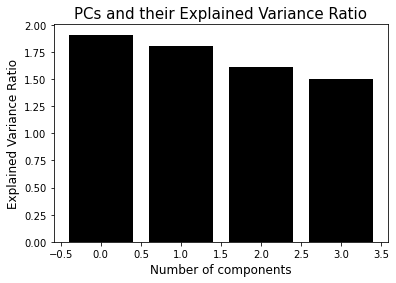

In [102]:
var = corona_pca.explained_variance_
# Plot explained variance by each PC
plt.bar([i for i, _ in enumerate(var)],var,color='black')
plt.title('PCs and their Explained Variance Ratio', fontsize=15)
plt.xlabel('Number of components',fontsize=12)
plt.ylabel('Explained Variance Ratio',fontsize=12)

In [104]:
#Cumulative Variance explained by each PC
import numpy as np
cum_var = np.cumsum(np.round(corona_pca.explained_variance_ratio_, decimals=4)*100)
print(cum_var)

[ 7.35 14.28 20.5  26.27]


Given that even after 4 Principal components, the total amount of variance explained was merely 26%, we decided to try with 8 principal components again. 

In [105]:
# implement pca with 8 components
corona_pca8 = PCA(n_components=8)
principal_comp8 = corona_pca8.fit_transform(corona_pd_scaled)

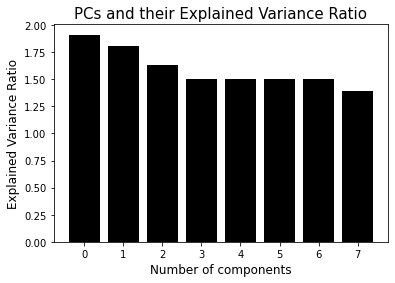

[ 7.35 14.29 20.55 26.32 32.09 37.86 43.62 48.99]


In [108]:
var8 = corona_pca8.explained_variance_
# Plot explained variance by each PC
plt.bar([i for i, _ in enumerate(var8)],var8,color='black')
plt.title('PCs and their Explained Variance Ratio', fontsize=15)
plt.xlabel('Number of components',fontsize=12)
plt.ylabel('Explained Variance Ratio',fontsize=12)
plt.show()

cum_var8 = np.cumsum(np.round(corona_pca8.explained_variance_ratio_, decimals=4)*100)
print(cum_var8)

In [92]:
principal_comp_df = pd.DataFrame(principal_comp, columns=['pca1', 'pca2','pca3'])
principal_comp_df.head()

,pca1,pca2,pca3
0,-2.039343,-1.787336,0.241045
1,-1.970666,-1.636193,0.419434
2,-2.091609,-1.853752,0.131679
3,-2.050315,-1.901968,0.147752
4,-1.981638,-1.750825,0.326141


In [93]:
principal_comp_df=pd.concat([principal_comp_df,pd.DataFrame({"Cluster":labels})],axis=1)
principal_comp_df.sample(5)

,pca1,pca2,pca3,Cluster
4618,-0.818624,3.532112,-1.842977,3
27574,-2.238553,0.785456,0.203441,3
12718,-1.989605,1.082563,0.471183,3
6622,-0.536268,-0.949123,-1.797921,3
7454,0.732541,-0.752978,-0.896593,0


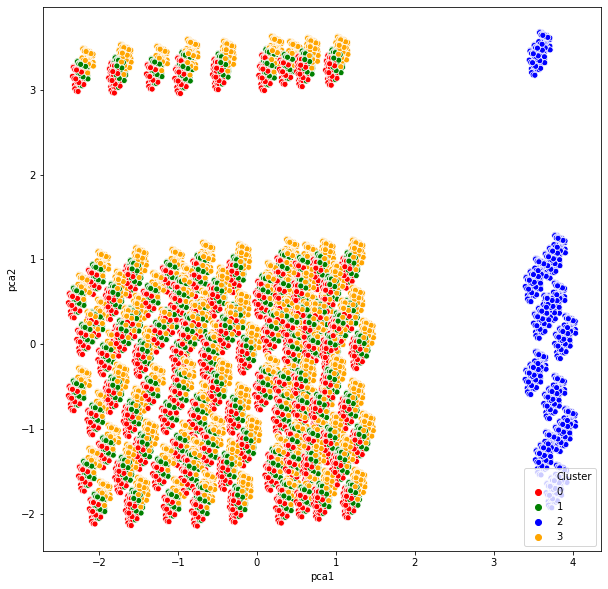

In [97]:
#Plotting the 2d-plot.
plt.figure(figsize=(10,10))
ax=sns.scatterplot(x='pca1',y='pca2', hue="Cluster",data=principal_comp_df ,palette=['red','green','blue','orange'])
plt.show()

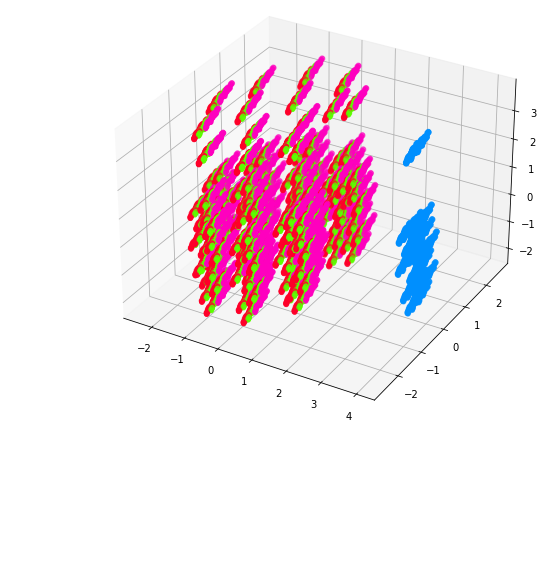

In [98]:
#Plotting the 3d-plot
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
sc=ax.scatter(xs=principal_comp_df['pca1'],ys=principal_comp_df['pca3'],zs=principal_comp_df['pca2'],c=principal_comp_df['Cluster'],marker='o',cmap="gist_rainbow")
plt.colorbar(sc)
plt.show()

After visualising the 2D and 3D plots of the PC-s with the distribution of data, we can conclude that PCA is not a good dimension reduction technique. This is observed from the total variance explained even after transforming into 8 Principal compoenents was still less than 50%. As a result, this technique of dimensionality reduction will not be considered, since it may be difficult to tease apart the components. Another possible reason is because the categorical nature of the features are independent of one another, and because they have been encoded into 1-s and 0-s, the decomposition of the variables may not have been useful.

## K Modes Clustering

In [109]:
# !pip install kmodes
from kmodes.kmodes import KModes

In [127]:
corona_pd.shape

(31680, 26)

In [128]:
# %%timeit
cost = []
K = range(1,5)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1, random_state = 111)
    kmode.fit_predict(corona_pd)
    cost.append(kmode.cost_)
    

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 248760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 248760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 248760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 248760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 248760.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 7548, cost: 221760.0
Run 1, iteration: 2/100, moves: 1728, cost: 221760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 8268, cost: 218160.0
Init: ini

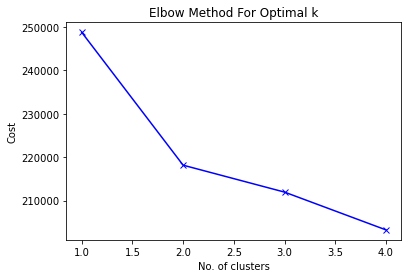

In [129]:
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

In [130]:
## build model wtih clusters
kmode = KModes(n_clusters = 2, init = "random", n_init = 5, verbose = 1, random_state = 111)
clusters = kmode.fit_predict(corona_pd)
clusters

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 7548, cost: 221760.0
Run 1, iteration: 2/100, moves: 1728, cost: 221760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 8268, cost: 218160.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 9436, cost: 234680.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 8190, cost: 221760.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 7752, cost: 229680.0
Best run was number 2


array([1, 1, 1, ..., 0, 0, 0], dtype=uint16)

In [114]:
clusters = clusters.reshape(-1,1)
clusters.shape

(31680, 1)

In [135]:
corona_pd_ = corona_pd.copy()
corona_pd_.reset_index(inplace = True)
clusters_df = pd.DataFrame(clusters)

clusters_df.columns = ['cluster_predicted']
combinedDf = pd.concat([corona_pd, clusters_df], axis = 1).reset_index()
combinedDf.drop(['index'], axis = 1, inplace = True)

In [136]:
combinedDf

,Fever,Tiredness,Dry-Cough,Difficulty-in-Breathing,Sore-Throat,None_Sympton,Pains,Nasal-Congestion,Runny-Nose,Diarrhea,None_Experiencing,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Gender_Female,Gender_Male,Gender_Transgender,Severity_Mild,Severity_Moderate,Severity_None,Severity_Severe,Contact_Dont-Know,Contact_No,Contact_Yes,cluster_predicted
0,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1
1,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1
2,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1
3,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1
4,1,1,1,1,1,0,1,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31675,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0
31676,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0
31677,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0
31678,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0


In [138]:
combinedDf.groupby(['cluster_predicted'])['Severity_Mild', 'Severity_Moderate', 'Severity_Severe', 'Severity_None'].sum()

,Severity_Mild,Severity_Moderate,Severity_Severe,Severity_None
cluster_predicted,,,,
0,3600,3600,3600,3600
1,4320,4320,4320,4320


In [137]:
combinedDf.groupby(['cluster_predicted'])['None_Experiencing', 'Diarrhea', 'Runny-Nose', 'Dry-Cough', 'Sore-Throat', 'Difficulty-in-Breathing', 'Gender_Male', 'Gender_Female', 'Age_0-9', 'Age_10-19', 'Age_20-24', 'Age_25-59', 'Age_60+', 'Contact_Dont-Know', 'Contact_No', 'Contact_Yes',].sum().round(2)

,None_Experiencing,Diarrhea,Runny-Nose,Dry-Cough,Sore-Throat,Difficulty-in-Breathing,Gender_Male,Gender_Female,Age_0-9,Age_10-19,Age_20-24,Age_25-59,Age_60+,Contact_Dont-Know,Contact_No,Contact_Yes
cluster_predicted,,,,,,,,,,,,,,,,
0,2160,4680,5040,3420,3780,3600,4800,4800,2880,2880,2880,2880,2880,4800,4800,4800
1,720,6840,12240,14400,6120,12240,5760,5760,3456,3456,3456,3456,3456,5760,5760,5760


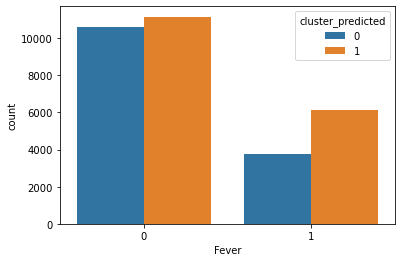

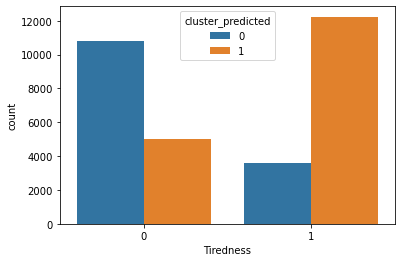

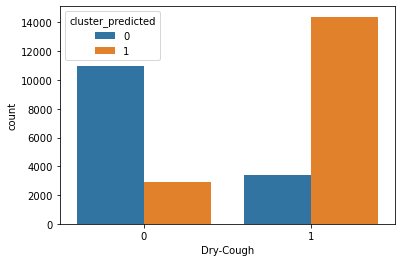

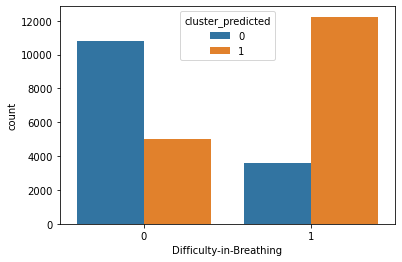

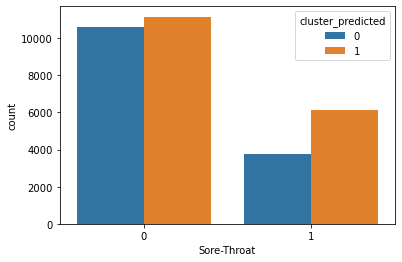

...

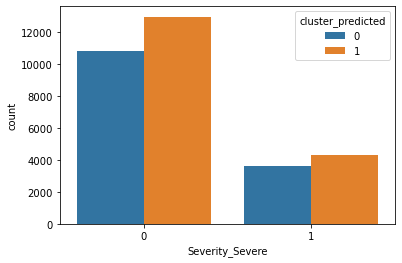

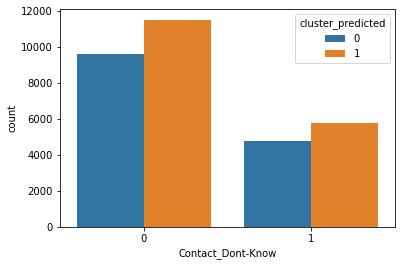

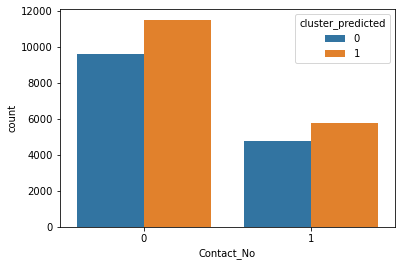

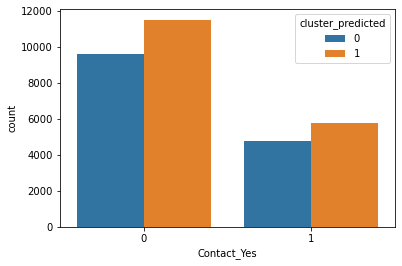

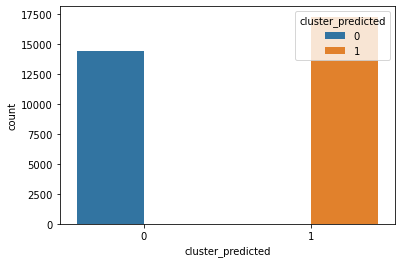

In [144]:
for x in combinedDf.columns:
    sns.countplot(x=combinedDf[x],order=combinedDf['Contact_No'].value_counts().index,hue=combinedDf['cluster_predicted'])
    plt.show()


### K-mode clustering findings

Majority of Cluster 0 indicated the following:
- healthy, with no symptoms

Majority of Cluster 1 : 
- have either runny nose, dry-cough or difficulty in breathing as predominant symptoms. This group is the group considered the more predominant, or prevalent coronavirus symptoms patients. 
- Cluster 1 patients had slightly equal number of patients in all four categories of severity. It meant that the severity was not indicative of the clusters. 

Given the similarities, it is possible that K-modes could not indicate any patterns or clusters. The patients were difficult to distinguish. It is possible that we may need to look into other factors such as health conditions, combined with exposure with coronavirus patients. 

## Summary of Findings

Given the categorical nature of our Coronovirus symptoms dataset, we can conclude that the use of K-means clustering may not be accurate, due to the distance metrics used in determining the number of clusters. PCA could also be slightly biased, as PCA measure similarities based on linear covariance of the features. K-modes could also not differentiate significantly between the clusters. K-modes measures dissimiliarity of the clusters, and gathers the clusters based on the <u> modes</u>. This means that for a cluster to form, mode is selected to minimise the cost functions. 
Therefore, the most appropriate metric for clustering of the Coronavirus symptoms dataset would actually be the K-means clustering technique. 



##  END ##